In [132]:
# imports
import pandas as pd
import numpy as np
import requests
from geopy.geocoders import Nominatim
from bs4 import BeautifulSoup
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium # map rendering library

# matplotlib
import matplotlib.pyplot as plt; plt.rcdefaults()
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

print('Libraries imported.')

Libraries imported.


In [57]:
# Create dataframe
d = {'City': ['Long Beach'
              , 'Irvine'
              , 'Costa Mesa'
              , 'Anaheim'
              , 'Lake Forest'
              , 'Huntington Beach'
              , 'Aliso Viejo'
              , 'Brea'
              , 'Fullerton'
              , 'La Habra'
              , 'Laguna Hills'
              , 'Mission Viejo'
              , 'Orange'
              , 'San Clemente'
              , 'Trabuco Canyon'
              , 'Westminster'
              , 'Capistrano Beach'
              , 'Fountain Valley'
              , 'Garden Grove'
              , 'Laguna Beach'
              , 'Laguna Niguel'
              , 'Newport Beach'
              , 'Rancho Santa Margarita'
              , 'San Juan Capistrano'
              , 'Seal Beach'
              , 'Tustin'
              , 'Yorba Linda'
              , 'Santa Ana'
              , 'Palms'
              , 'Sherman Oaks'
              , 'Pasadena']}
df = pd.DataFrame(data=d)
df

,City
0,Long Beach
1,Irvine
2,Costa Mesa
3,Anaheim
4,Lake Forest
5,Huntington Beach
6,Aliso Viejo
7,Brea
8,Fullerton
9,La Habra


In [58]:
# start geolocator
geolocator = Nominatim(user_agent="capstone")

In [59]:
# Function to find coordinates for the cities in df
def get_location(row):
    address = row['City'] + ', California' # Specify that all cities are in California to disambiguate
    location = geolocator.geocode(address)
    row['latitude'] = location.latitude
    row['longitude'] = location.longitude
    return row
# print('The geograpical coordinate of {} are {}, {}.'.format(address, latitude, longitude))

In [60]:
geolocated_table = df.apply(get_location, axis=1)
mapdf = geolocated_table

In [61]:
mapdf

,City,latitude,longitude
0,Long Beach,33.769016,-118.191605
1,Irvine,33.685697,-117.825982
2,Costa Mesa,33.663339,-117.903317
3,Anaheim,33.834752,-117.911732
4,Lake Forest,33.646926,-117.685921
5,Huntington Beach,33.678334,-118.000017
6,Aliso Viejo,33.576138,-117.725812
7,Brea,33.917044,-117.888856
8,Fullerton,33.870821,-117.929417
9,La Habra,33.933016,-117.944777


In [62]:
# Find center of chosen cities so that map is properly aligned
avg_latitude = mapdf['latitude'].mean()
avg_longitude = mapdf['longitude'].mean()
print('The average location to center the map is ({},{}).'.format(avg_latitude, avg_longitude))

The average location to center the map is (33.728295916129035,-117.8812261096774).


In [65]:
# Map cities
world_map = folium.Map(location=[avg_latitude,avg_longitude], zoom_start=9)

for a, b, c in zip(mapdf['latitude'], mapdf['longitude'], mapdf['City']):
    popup = folium.Popup(c)
    folium.CircleMarker(
        [a, b],
        popup=popup
        ).add_to(world_map)
world_map

In [66]:
# Connect to Foursquare
CLIENT_ID = 'TC45AR34LYBQDLYXAXVQVSYN0QGJ0MDDJ0FCMATVVGXG4UXP' # your Foursquare ID
CLIENT_SECRET = 'KQODPAZBOAHFTD3KGJMNKO0BUXV4LVDATAM32XBCWZNZ4XWV' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

# Look at top 100 venues within 500 meters
LIMIT = 100 # limit results to 100
radius = 3200 # search within 3200 meters (about 2 miles)
# print('Your credentails:')
# print('CLIENT_ID: ' + CLIENT_ID)
# print('CLIENT_SECRET:' + CLIENT_SECRET)

In [67]:
# Use function from last lab to find nearby venues for all cities

def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [68]:
# Use function from last lab to find category type

def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [69]:
socal_venues = getNearbyVenues(names=mapdf['City'],
                                   latitudes=mapdf['latitude'],
                                   longitudes=mapdf['longitude']
                                  )

Long Beach
Irvine
Costa Mesa
Anaheim
Lake Forest
Huntington Beach
Aliso Viejo
Brea
Fullerton
La Habra
Laguna Hills
Mission Viejo
Orange
San Clemente
Trabuco Canyon
Westminster
Capistrano Beach
Fountain Valley
Garden Grove
Laguna Beach
Laguna Niguel
Newport Beach
Rancho Santa Margarita
San Juan Capistrano
Seal Beach
Tustin
Yorba Linda
Santa Ana
Palms
Sherman Oaks
Pasadena


In [70]:
# Next few cells will explore the results

print(socal_venues.shape)

(1040, 7)


In [71]:
socal_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Long Beach,33.769016,-118.191605,L'Opera Ristorante,33.768296,-118.192375,Italian Restaurant
1,Long Beach,33.769016,-118.191605,George's Greek Cafe,33.768746,-118.192493,Greek Restaurant
2,Long Beach,33.769016,-118.191605,Gaucho Grill,33.769591,-118.192321,Argentinian Restaurant
3,Long Beach,33.769016,-118.191605,Agaves Kitchen/ Tequila,33.769704,-118.192290,Mexican Restaurant
4,Long Beach,33.769016,-118.191605,Pier 76 Fish Grill,33.767946,-118.192513,Seafood Restaurant


In [72]:
socal_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Aliso Viejo,59,59,59,59,59,59
Anaheim,60,60,60,60,60,60
Brea,46,46,46,46,46,46
Capistrano Beach,10,10,10,10,10,10
Costa Mesa,12,12,12,12,12,12
Fountain Valley,4,4,4,4,4,4
Fullerton,50,50,50,50,50,50
Garden Grove,12,12,12,12,12,12
Huntington Beach,16,16,16,16,16,16


In [73]:
print('There are {} unique categories.'.format(len(socal_venues['Venue Category'].unique())))

There are 196 unique categories.


In [74]:
# Cluster - start by setting up onehot variables
# one hot encoding
sc_onehot = pd.get_dummies(socal_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
sc_onehot['Neighborhood'] = socal_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [sc_onehot.columns[-1]] + list(sc_onehot.columns[:-1])
sc_onehot = sc_onehot[fixed_columns]

sc_onehot

,Yoga Studio,ATM,Adult Boutique,Advertising Agency,American Restaurant,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Beach,Beer Garden,Big Box Store,Bistro,Bookstore,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Business Service,Café,Cajun / Creole Restaurant,Candy Store,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Eastern European Restaurant,Electronics Store,Event Space,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Food,Food & Drink Shop,Food Court,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gas Station,Gastropub,Gay Bar,Gift Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Halal Restaurant,Hardware Store,Health & Beauty Service,Historic Site,History Museum,Hot Dog Joint,Hotel,Ice Cream Shop,Indian Restaurant,Indie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Juice Bar,Karaoke Bar,Korean Restaurant,Latin American Restaurant,Lawyer,Library,Lingerie Store,Liquor Store,Lounge,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Motel,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Nightlife Spot,Noodle House,Optical Shop,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Pet Store,Pharmacy,Pie Shop,Pier,Pizza Place,Playground,Plaza,Poke Place,Pool,Pool Hall,Pop-Up Shop,Pub,Public Bathroom,Racetrack,Record Shop,Residential Building (Apartment / Condo),Resort,Restaurant,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skating Rink,Smoke Shop,Smoothie Shop,South American Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Steakhouse,Supermarket,Supplement Shop,Surf Spot,Sushi Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tex-Mex Restaurant,Thai Restaurant,Theater,Thrift / Vintage Store,Toy / Game Store,Trail,Train Station,Vape Store,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Long Beach,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Long Beach,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Long Beach,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [76]:
# mean frequencies of each category
sc_grouped = sc_onehot.groupby('Neighborhood').mean().reset_index()
sc_grouped.head()

,Neighborhood,Yoga Studio,ATM,Adult Boutique,Advertising Agency,American Restaurant,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Beach,Beer Garden,Big Box Store,Bistro,Bookstore,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Business Service,Café,Cajun / Creole Restaurant,Candy Store,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Eastern European Restaurant,Electronics Store,Event Space,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Food,Food & Drink Shop,Food Court,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gas Station,Gastropub,Gay Bar,Gift Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Halal Restaurant,Hardware Store,Health & Beauty Service,Historic Site,History Museum,Hot Dog Joint,Hotel,Ice Cream Shop,Indian Restaurant,Indie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Juice Bar,Karaoke Bar,Korean Restaurant,Latin American Restaurant,Lawyer,Library,Lingerie Store,Liquor Store,Lounge,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Motel,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,New American Restaurant,Nightlife Spot,Noodle House,Optical Shop,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Pet Store,Pharmacy,Pie Shop,Pier,Pizza Place,Playground,Plaza,Poke Place,Pool,Pool Hall,Pop-Up Shop,Pub,Public Bathroom,Racetrack,Record Shop,Residential Building (Apartment / Condo),Resort,Restaurant,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skating Rink,Smoke Shop,Smoothie Shop,South American Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Steakhouse,Supermarket,Supplement Shop,Surf Spot,Sushi Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tex-Mex Restaurant,Thai Restaurant,Theater,Thrift / Vintage Store,Toy / Game Store,Trail,Train Station,Vape Store,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint
0,Aliso Viejo,0.016949,0.0,0.0,0.0,0.016949,0.0,0.0,0.0,0.000000,0.0,0.016949,0.000000,0.0,0.0,0.000000,0.000000,0.016949,0.050847,0.016949,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.016949,0.016949,0.0,0.000000,0.016949,0.0,0.016949,0.0,0.016949,0.000000,0.0,0.0,0.016949,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.016949,0.016949,0.0,0.016949,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.033898,0.0,0.016949,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.016949,0.0,0.050847,0.0,0.000000,0.0,0.000000,0.0,0.033898,0.000000,0.016949,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.016949,0.00,0.0,0.0,0.000000,0.0,0.016949,0.0,0.016949,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.016949,0.0,0.0,0.033898,0.0,0.016949,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.016949,0.050847,0.0,0.0,0.016949,0.033898,0.0,0.0,0.016949,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.033898,0.0,0.016949,0.016949,0.000000,0.0,0.000000,0.016949,0.0,0.016949,0.0,0.016949,0.000000,0.033898,0.0,0.000000,0.000000,0.0,0.0,0.0,0.016949,0.0,0.016949,0.016949,0.0,0.0,0.016949,0.050847,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.016949,0.000000,0.0,0.000000,0.000000,0.0,0.0
1,Anaheim,0.0000

In [77]:
sc_subset = sc_grouped[['Neighborhood','Coffee Shop','Concert Hall', 'Café', 'Theater','Park']]
sc_subset.loc[:,'total'] = sc_subset['Coffee Shop'] + sc_subset['Concert Hall'] + sc_subset['Café'] + sc_subset['Theater'] + sc_subset['Park']
sc_subset.sort_values(by='total',ascending=False)

D:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
D:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


,Neighborhood,Coffee Shop,Concert Hall,Café,Theater,Park,total
9,Irvine,0.200000,0.000000,0.000000,0.000000,0.200000,0.400000
12,Laguna Hills,0.000000,0.000000,0.000000,0.166667,0.166667,0.333333
24,Santa Ana,0.041667,0.000000,0.125000,0.041667,0.000000,0.208333
4,Costa Mesa,0.000000,0.083333,0.000000,0.083333,0.000000,0.166667
19,Palms,0.000000,0.000000,0.142857,0.000000,0.000000,0.142857
18,Orange,0.046512,0.000000,0.069767,0.023256,0.000000,0.139535
30,Yorba Linda,0.066667,0.000000,0.000000,0.000000,0.066667,0.133333
8,Huntington Beach,0.000000,0.000000,0.000000,0.062500,0.062500,0.125000
10,La Habra,0.000000,0.000000,0.000000,0.125000,0.000000,0.125000
6,Fullerton,0.040000,0.000000,0.060000,0.000000,0.020000,0.120000


In [78]:
# By frequency, Santa Ana is the most attractive due to the high frequency of coffee shops
# What about the absolute #?

sc_grouped_count = sc_onehot.groupby('Neighborhood').sum().reset_index()
sc_grouped_count

,Neighborhood,Yoga Studio,ATM,Adult Boutique,Advertising Agency,American Restaurant,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Beach,Beer Garden,Big Box Store,Bistro,Bookstore,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Business Service,Café,Cajun / Creole Restaurant,Candy Store,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Eastern European Restaurant,Electronics Store,Event Space,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Food,Food & Drink Shop,Food Court,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gas Station,Gastropub,Gay Bar,Gift Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Halal Restaurant,Hardware Store,Health & Beauty Service,Historic Site,History Museum,Hot Dog Joint,Hotel,Ice Cream Shop,Indian Restaurant,Indie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Juice Bar,Karaoke Bar,Korean Restaurant,Latin American Restaurant,Lawyer,Library,Lingerie Store,Liquor Store,Lounge,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Motel,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,New American Restaurant,Nightlife Spot,Noodle House,Optical Shop,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Pet Store,Pharmacy,Pie Shop,Pier,Pizza Place,Playground,Plaza,Poke Place,Pool,Pool Hall,Pop-Up Shop,Pub,Public Bathroom,Racetrack,Record Shop,Residential Building (Apartment / Condo),Resort,Restaurant,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skating Rink,Smoke Shop,Smoothie Shop,South American Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Steakhouse,Supermarket,Supplement Shop,Surf Spot,Sushi Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tex-Mex Restaurant,Thai Restaurant,Theater,Thrift / Vintage Store,Toy / Game Store,Trail,Train Station,Vape Store,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint
0,Aliso Viejo,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,3,1,0,0,0,0,0,0,0,1,1,0,0,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,1,0,3,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,2,0,1,0,0,0,0,0,0,0,0,0,1,3,0,0,1,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,1,1,0,0,0,1,0,1,0,1,0,2,0,0,0,0,0,0,1,0,1,1,0,0,1,3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,Anaheim,0,0,0,0,1,0,0,0,1,0,0,2,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,2,0,1,0,1,1,0,0,1,0,0,1,0,0,1,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,2,0,0,0,1,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,2,3,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,2,0,1,2,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,2,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0
2,Brea,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,5,0,1,0,0,0,0,2,0,0,0,2,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,2,0,0,0,1,0,2,0,0,0,0,0,1,0,2,0,0,0,1,1,0,0,0,0,1,0,0
3,Capistrano Beach,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0

In [79]:
sc_subset_2 = sc_grouped_count[['Neighborhood','Coffee Shop','Concert Hall', 'Café', 'Theater','Park']]
sc_subset_2.loc[:,'total'] = sc_subset_2['Coffee Shop'] + sc_subset_2['Concert Hall'] + sc_subset_2['Café'] + sc_subset_2['Theater'] + sc_subset_2['Park'] 
sc_subset_2.sort_values(by='total',ascending=False)

D:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
D:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


,Neighborhood,Coffee Shop,Concert Hall,Café,Theater,Park,total
15,Long Beach,4,1,1,0,1,7
25,Seal Beach,4,0,3,0,0,7
6,Fullerton,2,0,3,0,1,6
18,Orange,2,0,3,1,0,6
24,Santa Ana,1,0,3,1,0,5
20,Pasadena,3,1,0,0,1,5
1,Anaheim,1,0,1,1,1,4
26,Sherman Oaks,3,0,1,0,0,4
23,San Juan Capistrano,4,0,0,0,0,4
17,Newport Beach,3,1,0,0,0,4


In [80]:
# By raw count, Long Beach is most attractive

In [81]:
# Clustering

# Print top 5 categories for each neighborhood
num_top_venues = 5
for hood in sc_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = sc_grouped[sc_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Aliso Viejo----
                    venue  freq
0                  Bakery  0.05
1         Thai Restaurant  0.05
2  Furniture / Home Store  0.05
3                    Park  0.05
4          Sandwich Place  0.03


----Anaheim----
                venue  freq
0  Mexican Restaurant  0.07
1   Indian Restaurant  0.05
2    Asian Restaurant  0.03
3      Sandwich Place  0.03
4      Shipping Store  0.03


----Brea----
              venue  freq
0    Clothing Store  0.11
1  Department Store  0.04
2    Cosmetics Shop  0.04
3  Sushi Restaurant  0.04
4  Toy / Game Store  0.04


----Capistrano Beach----
                venue  freq
0              Resort   0.3
1        Dance Studio   0.1
2  Italian Restaurant   0.1
3          Restaurant   0.1
4           Surf Spot   0.1


----Costa Mesa----
          venue  freq
0  Intersection  0.08
1      Pharmacy  0.08
2     BBQ Joint  0.08
3     Pet Store  0.08
4   Flea Market  0.08


----Fountain Valley----
                  venue  freq
0          Intersection  0.

In [93]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [113]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = sc_grouped['Neighborhood']

for ind in np.arange(sc_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(sc_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Aliso Viejo,Park,Thai Restaurant,Furniture / Home Store,Bakery,Sandwich Place
1,Anaheim,Mexican Restaurant,Indian Restaurant,Juice Bar,Food Court,Sushi Restaurant
2,Brea,Clothing Store,Cosmetics Shop,Sushi Restaurant,Toy / Game Store,Sporting Goods Shop
3,Capistrano Beach,Resort,Dance Studio,Italian Restaurant,Mexican Restaurant,Restaurant
4,Costa Mesa,Intersection,Pharmacy,Food Truck,Farm,Burger Joint


In [114]:
# set number of clusters
kclusters = 4

sc_grouped_clustering = sc_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(sc_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:100] 

array([0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 2, 0, 0, 0])

In [115]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

sc_merged = mapdf

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
sc_merged = sc_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='City') # Neighborhood in new dataset

sc_merged.head() # check the last columns!

,City,latitude,longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Long Beach,33.769016,-118.191605,0,American Restaurant,Coffee Shop,Pizza Place,Brewery,Bar
1,Irvine,33.685697,-117.825982,0,Trail,Baseball Stadium,Coffee Shop,Park,Wings Joint
2,Costa Mesa,33.663339,-117.903317,0,Intersection,Pharmacy,Food Truck,Farm,Burger Joint
3,Anaheim,33.834752,-117.911732,0,Mexican Restaurant,Indian Restaurant,Juice Bar,Food Court,Sushi Restaurant
4,Lake Forest,33.646926,-117.685921,0,Pizza Place,Sandwich Place,Asian Restaurant,Fast Food Restaurant,Business Service


In [116]:
# create map
map_clusters = folium.Map(location=[avg_latitude,avg_longitude], zoom_start=9)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(sc_merged['latitude'], sc_merged['longitude'], sc_merged['City'], sc_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

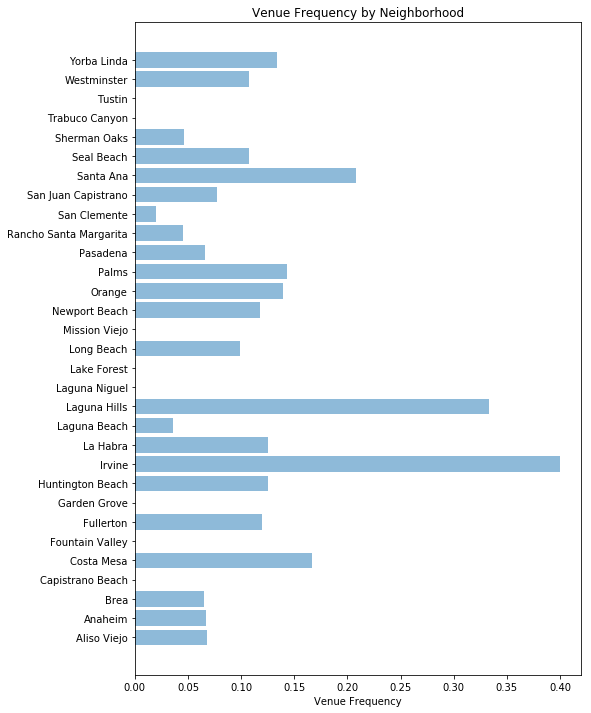

In [128]:
objects = sc_subset['Neighborhood']
y_pos = np.arange(len(objects))
performance = sc_subset['total']

fig = plt.figure(figsize=(8,12))

plt.barh(y_pos, performance, align='center', alpha=0.5)
plt.yticks(y_pos, objects)
plt.xlabel('Venue Frequency')
plt.title('Venue Frequency by Neighborhood')

plt.show()

In [121]:
# kt (count) of each category
sc_grouped_kt = sc_onehot.groupby('Neighborhood').sum().reset_index()
sc_grouped_kt.head()

,Neighborhood,Yoga Studio,ATM,Adult Boutique,Advertising Agency,American Restaurant,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Beach,Beer Garden,Big Box Store,Bistro,Bookstore,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Business Service,Café,Cajun / Creole Restaurant,Candy Store,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,City Hall,Clothing Store,Cocktail Bar,Coffee Shop,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Eastern European Restaurant,Electronics Store,Event Space,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Food,Food & Drink Shop,Food Court,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gas Station,Gastropub,Gay Bar,Gift Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Halal Restaurant,Hardware Store,Health & Beauty Service,Historic Site,History Museum,Hot Dog Joint,Hotel,Ice Cream Shop,Indian Restaurant,Indie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Juice Bar,Karaoke Bar,Korean Restaurant,Latin American Restaurant,Lawyer,Library,Lingerie Store,Liquor Store,Lounge,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Motel,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,New American Restaurant,Nightlife Spot,Noodle House,Optical Shop,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Pet Store,Pharmacy,Pie Shop,Pier,Pizza Place,Playground,Plaza,Poke Place,Pool,Pool Hall,Pop-Up Shop,Pub,Public Bathroom,Racetrack,Record Shop,Residential Building (Apartment / Condo),Resort,Restaurant,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skating Rink,Smoke Shop,Smoothie Shop,South American Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Steakhouse,Supermarket,Supplement Shop,Surf Spot,Sushi Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tex-Mex Restaurant,Thai Restaurant,Theater,Thrift / Vintage Store,Toy / Game Store,Trail,Train Station,Vape Store,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint
0,Aliso Viejo,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,3,1,0,0,0,0,0,0,0,1,1,0,0,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,1,0,3,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,2,0,1,0,0,0,0,0,0,0,0,0,1,3,0,0,1,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,1,1,0,0,0,1,0,1,0,1,0,2,0,0,0,0,0,0,1,0,1,1,0,0,1,3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,Anaheim,0,0,0,0,1,0,0,0,1,0,0,2,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,2,0,1,0,1,1,0,0,1,0,0,1,0,0,1,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,2,0,0,0,1,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,2,3,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,2,0,1,2,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,2,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0
2,Brea,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,5,0,1,0,0,0,0,2,0,0,0,2,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,2,0,0,0,1,0,2,0,0,0,0,0,1,0,2,0,0,0,1,1,0,0,0,0,1,0,0
3,Capistrano Beach,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0

In [122]:
# Clustering

# Print top 5 categories for each neighborhood
num_top_venues = 5
for hood in sc_grouped_kt['Neighborhood']:
    print("----"+hood+"----")
    temp = sc_grouped_kt[sc_grouped_kt['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Aliso Viejo----
                    venue  freq
0                  Bakery   3.0
1         Thai Restaurant   3.0
2  Furniture / Home Store   3.0
3                    Park   3.0
4          Sandwich Place   2.0


----Anaheim----
                venue  freq
0  Mexican Restaurant   4.0
1   Indian Restaurant   3.0
2    Asian Restaurant   2.0
3      Sandwich Place   2.0
4      Shipping Store   2.0


----Brea----
              venue  freq
0    Clothing Store   5.0
1  Department Store   2.0
2    Cosmetics Shop   2.0
3  Sushi Restaurant   2.0
4  Toy / Game Store   2.0


----Capistrano Beach----
                venue  freq
0              Resort   3.0
1        Dance Studio   1.0
2  Italian Restaurant   1.0
3          Restaurant   1.0
4           Surf Spot   1.0


----Costa Mesa----
          venue  freq
0  Intersection   1.0
1      Pharmacy   1.0
2     BBQ Joint   1.0
3     Pet Store   1.0
4   Flea Market   1.0


----Fountain Valley----
                  venue  freq
0          Intersection   1

In [138]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = sc_grouped['Neighborhood']

for ind in np.arange(sc_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(sc_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Aliso Viejo,Park,Thai Restaurant,Furniture / Home Store,Bakery,Sandwich Place
1,Anaheim,Mexican Restaurant,Indian Restaurant,Juice Bar,Food Court,Sushi Restaurant
2,Brea,Clothing Store,Cosmetics Shop,Sushi Restaurant,Toy / Game Store,Sporting Goods Shop
3,Capistrano Beach,Resort,Dance Studio,Italian Restaurant,Mexican Restaurant,Restaurant
4,Costa Mesa,Intersection,Pharmacy,Food Truck,Farm,Burger Joint


In [139]:
# set number of clusters
kclusters = 4

sc_grouped_kt_clustering = sc_grouped_kt.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(sc_grouped_kt_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:100] 

array([3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 3, 0, 0, 0, 1, 0,
       1, 1, 0, 1, 2, 0, 0, 0, 0])

In [140]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels kt', kmeans.labels_)

sc_merged = mapdf

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
sc_merged = sc_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='City') # Neighborhood in new dataset

sc_merged # check the last columns!

,City,latitude,longitude,Cluster Labels kt,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Long Beach,33.769016,-118.191605,1,American Restaurant,Coffee Shop,Pizza Place,Brewery,Bar
1,Irvine,33.685697,-117.825982,0,Trail,Baseball Stadium,Coffee Shop,Park,Wings Joint
2,Costa Mesa,33.663339,-117.903317,0,Intersection,Pharmacy,Food Truck,Farm,Burger Joint
3,Anaheim,33.834752,-117.911732,0,Mexican Restaurant,Indian Restaurant,Juice Bar,Food Court,Sushi Restaurant
4,Lake Forest,33.646926,-117.685921,0,Pizza Place,Sandwich Place,Asian Restaurant,Fast Food Restaurant,Business Service
5,Huntington Beach,33.678334,-118.000017,0,Mexican Restaurant,Grocery Store,Spa,Fast Food Restaurant,Shopping Plaza
6,Aliso Viejo,33.576138,-117.725812,3,Park,Thai Restaurant,Furniture / Home Store,Bakery,Sandwich Place
7,Brea,33.917044,-117.888856,0,Clothing Store,Cosmetics Shop,Sushi Restaurant,Toy / Game Store,Sporting Goods Shop
8,Fullerton,33.870821,-117.929417,0,Pizza Place,Café,Bar,Mediterranean Restaurant,Korean Restaurant
9,La Habra,33.933016,-117.944777,0,Mexican Restaurant,Ice Cream Shop,Theater,Pizza Place,Burger Joint


In [127]:
# create map
map_clusters = folium.Map(location=[avg_latitude,avg_longitude], zoom_start=9)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(sc_merged['latitude'], sc_merged['longitude'], sc_merged['City'], sc_merged['Cluster Labels kt']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

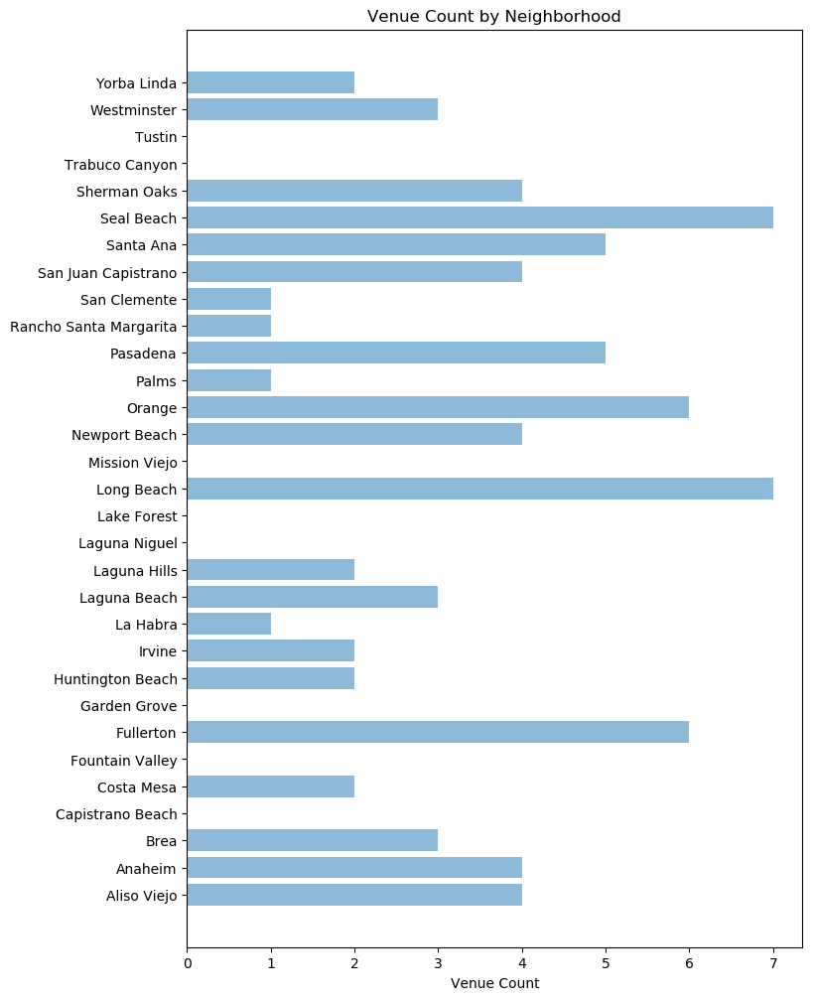

In [136]:
objects = sc_subset_2['Neighborhood']
y_pos = np.arange(len(objects))
performance = sc_subset_2['total']
colors = ['#d01c8b','#f1b6da','#b8e186','#4dac26']
#colorlist = sc_merged['Cluster Labels kt']

fig = plt.figure(figsize=(8,12))

plt.barh(y_pos, performance, align='center', alpha=0.5)
plt.yticks(y_pos, objects)
plt.xlabel('Venue Count')
plt.title('Venue Count by Neighborhood')

plt.show()

In [ ]:
# Irvine wins on frequency, Seal Beach wins on raw count 

In [146]:
# Look at clusters 0 and 1 to aid with decision
sc_merged.loc[sc_merged['Cluster Labels kt'] == 0, sc_merged.columns[[0] + list(range(4, sc_merged.shape[1]))]]

,City,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
1,Irvine,Trail,Baseball Stadium,Coffee Shop,Park,Wings Joint
2,Costa Mesa,Intersection,Pharmacy,Food Truck,Farm,Burger Joint
3,Anaheim,Mexican Restaurant,Indian Restaurant,Juice Bar,Food Court,Sushi Restaurant
4,Lake Forest,Pizza Place,Sandwich Place,Asian Restaurant,Fast Food Restaurant,Business Service
5,Huntington Beach,Mexican Restaurant,Grocery Store,Spa,Fast Food Restaurant,Shopping Plaza
7,Brea,Clothing Store,Cosmetics Shop,Sushi Restaurant,Toy / Game Store,Sporting Goods Shop
8,Fullerton,Pizza Place,Café,Bar,Mediterranean Restaurant,Korean Restaurant
9,La Habra,Mexican Restaurant,Ice Cream Shop,Theater,Pizza Place,Burger Joint
10,Laguna Hills,Playground,Theater,American Restaurant,Nightlife Spot,Park
12,Orange,Bar,Restaurant,Café,Coffee Shop,Sandwich Place


In [147]:
# Look at clusters 0 and 1 to aid with decision
sc_merged.loc[sc_merged['Cluster Labels kt'] == 1, sc_merged.columns[[0] + list(range(4, sc_merged.shape[1]))]]

,City,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Long Beach,American Restaurant,Coffee Shop,Pizza Place,Brewery,Bar
13,San Clemente,Mexican Restaurant,Pizza Place,Italian Restaurant,American Restaurant,Deli / Bodega
19,Laguna Beach,American Restaurant,Seafood Restaurant,New American Restaurant,Boutique,Italian Restaurant
23,San Juan Capistrano,Coffee Shop,Fast Food Restaurant,Mexican Restaurant,Bakery,American Restaurant
24,Seal Beach,American Restaurant,Coffee Shop,Thai Restaurant,Café,Mexican Restaurant
30,Pasadena,American Restaurant,Burger Joint,Steakhouse,Sushi Restaurant,Coffee Shop
